In [ ]:
import re, numpy as np, pandas as pd
from pprint import pprint

# Gensim
import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt
import nltk
nltk.download('stopwords')
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])

%matplotlib inline
warnings.filterwarnings("ignore",category=DeprecationWarning)
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
import pandas as pd
data = pd.read_csv('/content/drive/MyDrive/articles1.csv', engine="python", on_bad_lines='skip')

In [ ]:
def sent_to_words(sentences):
    for sent in sentences:
        sent = re.sub('\S*@\S*\s?', '', sent)  # remove emails
        sent = re.sub('\s+', ' ', sent)  # remove newline chars
        sent = re.sub("\'", "", sent)  # remove single quotes
        sent = gensim.utils.simple_preprocess(str(sent), deacc=True)
        yield(sent)

# Convert to list
cleaned = data.content.values.tolist()
data_words = list(sent_to_words(cleaned))
print(data_words[:1])

[['washington', 'congressional', 'republicans', 'have', 'new', 'fear', 'when', 'it', 'comes', 'to', 'their', 'health', 'care', 'lawsuit', 'against', 'the', 'obama', 'administration', 'they', 'might', 'win', 'the', 'incoming', 'trump', 'administration', 'could', 'choose', 'to', 'no', 'longer', 'defend', 'the', 'executive', 'branch', 'against', 'the', 'suit', 'which', 'challenges', 'the', 'administration', 'authority', 'to', 'spend', 'billions', 'of', 'dollars', 'on', 'health', 'insurance', 'subsidies', 'for', 'and', 'americans', 'handing', 'house', 'republicans', 'big', 'victory', 'on', 'issues', 'but', 'sudden', 'loss', 'of', 'the', 'disputed', 'subsidies', 'could', 'conceivably', 'cause', 'the', 'health', 'care', 'program', 'to', 'implode', 'leaving', 'millions', 'of', 'people', 'without', 'access', 'to', 'health', 'insurance', 'before', 'republicans', 'have', 'prepared', 'replacement', 'that', 'could', 'lead', 'to', 'chaos', 'in', 'the', 'insurance', 'market', 'and', 'spur', 'politic

In [ ]:
import string
import gensim
import spacy

# Convert stop_words to a set for faster membership checks
stop_words = set(stop_words)

# Load the spaCy model outside the process_words function
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100)  # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'], nlp=nlp):
    """Remove Stopwords, Form Bigrams, Trigrams, and Lemmatization"""
    texts = [[word for word in doc if word not in stop_words] for doc in texts]
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[doc] for doc in texts]
    texts_out = [[token.lemma_ for token in nlp(" ".join(sent)) if token.pos_ in allowed_postags] for sent in texts]
    texts_out = [[word for word in doc if word not in stop_words] for doc in texts_out]
    return texts_out

# Process the data_words using the updated process_words function
data_ready = process_words(data_words)  # processed Text Data!

NameError: ignored

In [ ]:
data_ready

[['new',
  'fear',
  'health_care',
  'lawsuit',
  'win',
  'incoming',
  'administration',
  'choose',
  'long',
  'defend',
  'executive_branch',
  'suit',
  'challenge',
  'administration',
  'authority',
  'spend',
  'billion',
  'dollar',
  'health_insurance',
  'subsidy',
  'hand',
  'house',
  'big',
  'victory',
  'issue',
  'sudden',
  'loss',
  'dispute',
  'subsidy',
  'conceivably',
  'cause',
  'health_care',
  'program',
  'implode',
  'leave',
  'million',
  'people',
  'access',
  'prepare',
  'replacement',
  'lead',
  'chaos',
  'insurance',
  'market',
  'spur',
  'political',
  'backlash',
  'gain',
  'full',
  'control',
  'government',
  'stave',
  'outcome',
  'republican',
  'find',
  'awkward',
  'position',
  'appropriate',
  'temporarily',
  'prop',
  'law',
  'anger',
  'conservative',
  'voter',
  'demand',
  'end',
  'law',
  'year',
  'twist',
  'administration',
  'worry',
  'preserve',
  'executive_branch',
  'prerogative',
  'choose',
  'fight',
  'rep

In [ ]:
def to_string(text):
    # Convert list to string
    text = ' '.join(map(str, text))

    return text
proccessedstr = list(map(to_string, data_ready))

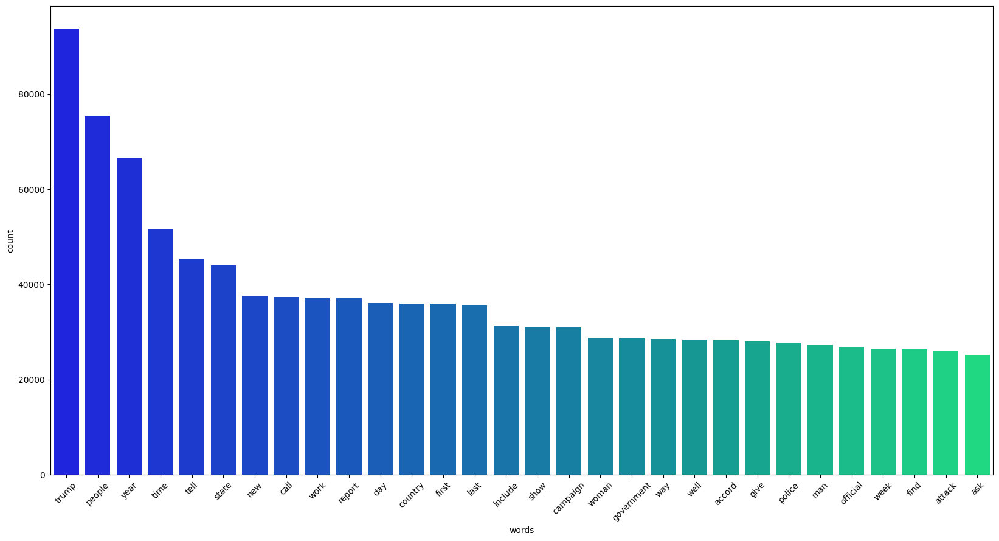

In [ ]:
# Import Counter
import seaborn as sns
from collections import Counter

# Join all word corpus
review_words = ','.join(list(proccessedstr))

# Count and find the 30 most frequent
Counter = Counter(review_words.split())
most_frequent = Counter.most_common(30)

# Bar plot of frequent words
fig = plt.figure(1, figsize = (20,10))
_ = pd.DataFrame(most_frequent, columns=("words","count"))
sns.barplot(x = 'words', y = 'count', data = _, palette = 'winter')
plt.xticks(rotation=45);

In [ ]:
# Create Dictionary
id2word = gensim.corpora.Dictionary(data_ready)

# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in data_ready]

1
2
3
4
5
6
7
8
9


,number_of_topics,coherence_score
0,1,0.242778
1,2,0.293162
2,3,0.344174
3,4,0.330358
4,5,0.365693
5,6,0.368435
6,7,0.427702
7,8,0.407293
8,9,0.406752


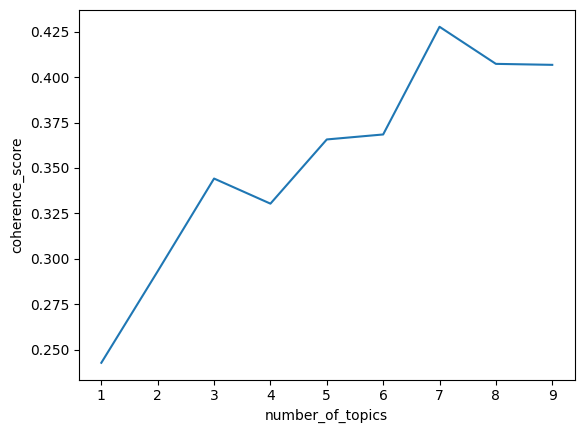

In [ ]:
from gensim.models import CoherenceModel

# Compute coherence score
number_of_topics = []
coherence_score = []
for i in range(1,10):
    print(i)
    lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           iterations=50,
                                           num_topics=i)
    coherence_model_lda = CoherenceModel(model=lda_model,
                                       texts=data_ready,
                                       dictionary=id2word,
                                       coherence='c_v')
    coherence_lda = coherence_model_lda.get_coherence()
    number_of_topics.append(i)
    coherence_score.append(coherence_lda)

# Create a dataframe of coherence score by number of topics
topic_coherence = pd.DataFrame({'number_of_topics':number_of_topics,
                                'coherence_score':coherence_score})

# Print a line plot
sns.lineplot(data=topic_coherence, x='number_of_topics', y='coherence_score')
topic_coherence

In [ ]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=6,
                                           random_state=100,
                                           update_every=1,
                                           chunksize=10,
                                           passes=10,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True)

pprint(lda_model.print_topics())

[(0,
  '0.031*"film" + 0.022*"game" + 0.020*"team" + 0.017*"play" + 0.016*"star" + '
  '0.015*"show" + 0.014*"movie" + 0.013*"week" + 0.012*"season" + 0.010*"tv"'),
 (1,
  '0.038*"trump" + 0.010*"election" + 0.009*"state" + 0.007*"campaign" + '
  '0.006*"vote" + 0.006*"policy" + 0.006*"president" + 0.005*"political" + '
  '0.005*"presidential" + 0.005*"country"'),
 (2,
  '0.017*"police" + 0.012*"officer" + 0.011*"attack" + 0.010*"kill" + '
  '0.010*"report" + 0.009*"military" + 0.009*"group" + 0.008*"man" + '
  '0.008*"country" + 0.007*"case"'),
 (3,
  '0.016*"people" + 0.010*"thing" + 0.010*"time" + 0.009*"work" + 0.008*"way" '
  '+ 0.007*"year" + 0.006*"look" + 0.006*"feel" + 0.006*"tell" + '
  '0.006*"student"'),
 (4,
  '0.016*"company" + 0.016*"year" + 0.009*"new" + 0.009*"business" + '
  '0.006*"market" + 0.005*"plan" + 0.005*"accord" + 0.005*"big" + '
  '0.004*"percent" + 0.004*"much"'),
 (5,
  '0.021*"car" + 0.009*"study" + 0.007*"space" + 0.006*"water" + 0.006*"test" '
  '+ 0.0

In [ ]:
!pip install --upgrade pyLDAvis
!pip install --upgrade joblib

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Import and enable notebook to run visualization
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()

vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary=lda_model.id2word, n_jobs=1)

vis

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.141645 -0.116190       1        1  32.442628
3     -0.039782 -0.118133       2        1  28.078138
4     -0.097128 -0.083625       3        1  15.337994
2     -0.132485  0.040497       4        1  13.384712
5      0.025785  0.363879       5        1   7.032363
0      0.385256 -0.086428       6        1   3.724165, topic_info=         Term           Freq          Total Category  logprob  loglift
228     trump  147228.000000  147228.000000  Default  30.0000  30.0000
1098  company   29706.000000   29706.000000  Default  29.0000  29.0000
741    police   26803.000000   26803.000000  Default  28.0000  28.0000
859      show   29546.000000   29546.000000  Default  27.0000  27.0000
340       car   17906.000000   17906.000000  Default  26.0000  26.0000
...       ...            ...            ...      ...      ...      ...
983     video    2586.997398   10219.265391   Topic6  -5.1400   1.9166
115      last    3311.853214   31244.673334   Topic6  -4.8930   1.0460
72        end    2839.215361   20121.256225   Topic6  -5.0470   1.3321
242      year    3239.374625   71243.330574   Topic6  -4.9151   0.1996
997     watch    2261.220309    8576.295587   Topic6  -5.2746   1.9572

[377 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
245       1  0.232950  accord
245       3  0.319632  accord
245       4  0.416951  accord
245       5  0.030426  accord
2815      2  0.999750   actor
...     ...       ...     ...
242       3  0.406957    year
242       4  0.145010    year
242       6  0.045464    year
1022      2  0.994977   young
1022      4  0.004942   young

[652 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 4, 5, 3, 6, 1])